# Fall down Project
* share some images from https://www.kaggle.com/datasets/uttejkumarkandagatla/fall-detection-dataset/data
* https://heartbeat.comet.ml/custom-video-classification-using-yolov8-ec07a9de3b1a

1) tools
2) write your code
3) build model on images
4) use model (run inference)
5) explain model
6) apply model on videos

# pypi

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
ls drive/MyDrive/Summer_CV/

Fall_down_cls.ipynb  falldown_data/


In [ ]:
import os, sys

In [ ]:
pip install -U ultralytics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 936.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.3/872.3 kB 18.5 MB/s eta 0:00:00


In [ ]:
import ultralytics
ultralytics.__version__

'8.2.85'

In [ ]:
from ultralytics import YOLO, settings

In [ ]:
# View all settings
print(settings)

# Return a specific setting
value = settings['runs_dir']

{'settings_version': '0.0.5', 'datasets_dir': '/content/datasets', 'weights_dir': 'weights', 'runs_dir': 'runs', 'uuid': '569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb', 'sync': True, 'api_key': '', 'openai_api_key': '', 'clearml': True, 'comet': True, 'dvc': True, 'hub': True, 'mlflow': True, 'neptune': True, 'raytune': True, 'tensorboard': True, 'wandb': True, 'vscode_msg': True}


In [ ]:
#set the current path as working path if the working path is not current path
settings.reset()

In [ ]:
# View all settings
print(settings)

{'settings_version': '0.0.5', 'datasets_dir': '/content/datasets', 'weights_dir': 'weights', 'runs_dir': 'runs', 'uuid': '569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb', 'sync': True, 'api_key': '', 'openai_api_key': '', 'clearml': True, 'comet': True, 'dvc': True, 'hub': True, 'mlflow': True, 'neptune': True, 'raytune': True, 'tensorboard': True, 'wandb': True, 'vscode_msg': True}


In [ ]:
# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image, ImageColor, ImageDraw, ImageFont, ImageOps

# For measuring the inference time.
import time, pickle
import requests
#from funcs import *

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

import torch, torchvision

2.17.0
The following GPU devices are available: /device:GPU:0


# Object Classification

* https://github.com/ultralytics/ultralytics?tab=readme-ov-file
* video link https://youtu.be/5BO0Il_YYAg

In [ ]:
# from ultralytics import YOLO

# # Load yolov8 nano model
# model = YOLO('yolov8n-cls.yaml')  # build a new model from YAML
# model = YOLO('yolov8n-cls.pt')  # load a pretrained model (recommended for training)
# model = YOLO('yolov8n-cls.yaml').load('yolov8n-cls.pt')  # build from YAML and transfer weights

In [ ]:
# Load a pretrained extra large YOLOv8x-cls Classification model
model = YOLO('yolov8x-cls.yaml').load('yolov8x-cls.pt')
#model = YOLO('./data.yaml', task = "classify").load('yolov8n-cls.pt')

YOLOv8x-cls summary: 183 layers, 57,422,840 parameters, 57,422,840 gradients, 155.3 GFLOPs


100%|██████████| 110M/110M [00:00<00:00, 347MB/s]


Transferred 302/302 items from pretrained weights


In [ ]:
tt_path = r"./drive/MyDrive/Summer_CV/falldown_data/train/pos/adult_10.jpg"

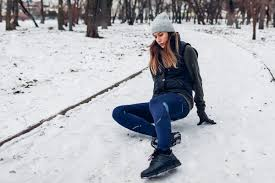

In [ ]:
img = Image.open(tt_path)
display(img)

# Train a new Fall-down binary classification model

In [ ]:
#pip install wandb -q -U

In [ ]:
import wandb
wandb.init() #force to re-login

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
model.train(data='./drive/MyDrive/Summer_CV/falldown_data/', epochs=10, imgsz=128, batch = 64, device = [0])

Ultralytics YOLOv8.2.85 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=classify, mode=train, model=yolov8x-cls.yaml, data=./drive/MyDrive/Summer_CV/falldown_data/, epochs=10, time=None, patience=100, batch=64, imgsz=128, save=True, save_period=-1, cache=False, device=[0], workers=8, project=None, name=train, exist_ok=False, pretrained=yolov8x-cls.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_lab

100%|██████████| 6.25M/6.25M [00:00<00:00, 109MB/s]


AMP: checks passed ✅


/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py:268: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning /content/drive/MyDrive/Summer_CV/falldown_data/train... 490 images, 0 corrupt: 100%|██████████| 490/490 [01:28<00:00,  5.55it/s]

train: New cache created: /content/drive/MyDrive/Summer_CV/falldown_data/train.cache



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/Summer_CV/falldown_data/test... 123 images, 0 corrupt: 100%|██████████| 123/123 [00:39<00:00,  3.13it/s]

val: New cache created: /content/drive/MyDrive/Summer_CV/falldown_data/test.cache


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 50 weight(decay=0.0), 51 weight(decay=0.0005), 51 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 128 train, 128 val
Using 2 dataloader workers
Logging results to runs/classify/train
Starting training for 10 epochs...


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem       loss  Instances       Size


       1/10      2.54G     0.6868         64        128:  25%|██▌       | 2/8 [00:02<00:07,  1.22s/it]

       1/10      2.54G     0.7034         64        128:  50%|█████     | 4/8 [00:03<00:02,  1.54it/s]
100%|██████████| 755k/755k [00:00<00:00, 19.4MB/s]
               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all      0.667          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 12.73it/s]

                   all      0.846          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 13.36it/s]

                   all      0.902          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 12.05it/s]

                   all      0.935          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 11.22it/s]

                   all      0.943          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]

                   all      0.943          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 12.69it/s]

                   all      0.943          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 12.07it/s]

                   all      0.951          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 13.42it/s]

                   all      0.967          1



      Epoch    GPU_mem       loss  Instances       Size


      10/10      2.72G    0.07028         42        128: 100%|██████████| 8/8 [00:03<00:00,  2.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00, 13.75it/s]

                   all      0.959          1



10 epochs completed in 0.031 hours.
Optimizer stripped from runs/classify/train/weights/last.pt, 112.5MB
Optimizer stripped from runs/classify/train/weights/best.pt, 112.5MB

Validating runs/classify/train/weights/best.pt...
Ultralytics YOLOv8.2.85 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x-cls summary (fused): 133 layers, 56,125,762 parameters, 0 gradients, 153.8 GFLOPs
WARNING ⚠️ Dataset 'split=val' not found, using 'split=test' instead.
train: /content/drive/MyDrive/Summer_CV/falldown_data/train... found 490 images in 2 classes ✅ 
val: None...
test: /content/drive/MyDrive/Summer_CV/falldown_data/test... found 123 images in 2 classes ✅ 


               classes   top1_acc   top5_acc: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


                   all      0.967          1
Speed: 0.0ms preprocess, 0.9ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train
Results saved to runs/classify/train


lr/pg0,▁▄▆▇██▇▆▄▂
lr/pg1,▁▄▆▇██▇▆▄▂
lr/pg2,▁▄▆▇██▇▆▄▂
metrics/accuracy_top1,▁▅▆▇▇▇▇███
metrics/accuracy_top5,▁▁▁▁▁▁▁▁▁▁
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/loss,█▇▅▄▃▂▂▁▁▁
val/loss,█▆▄▃▂▂▁▁▁▁
lr/pg0,6e-05


ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d389cacb040>
curves: []
curves_results: []
fitness: 0.983739823102951
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.9674796462059021, 'metrics/accuracy_top5': 1.0, 'fitness': 0.983739823102951}
save_dir: PosixPath('runs/classify/train')
speed: {'preprocess': 0.020527258151915015, 'inference': 0.9125810328537856, 'loss': 0.00012017847076664125, 'postprocess': 0.00010467157131288109}
task: 'classify'
top1: 0.9674796462059021
top5: 1.0

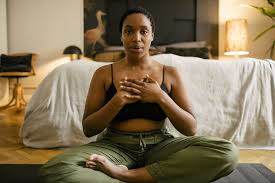

In [ ]:
tst_img = Image.open('./drive/MyDrive/Summer_CV/falldown_data/test/neg/image_12.jpg')
display(tst_img)

In [ ]:
#test classification on an image
results = model("./drive/MyDrive/Summer_CV/falldown_data/test/neg/image_12.jpg")


image 1/1 /content/drive/MyDrive/Summer_CV/falldown_data/test/neg/image_12.jpg: 128x128 neg 0.99, pos 0.01, 11.7ms
Speed: 31.2ms preprocess, 11.7ms inference, 0.1ms postprocess per image at shape (1, 3, 128, 128)


In [ ]:
probs = list(results[0].probs.data)
classes = results[0].names
highest_prob = max(probs)
highest_prob_index = probs.index(highest_prob)
print(f"Class: {classes[highest_prob_index]}")

Class: neg


In [ ]:
ls

In [ ]:
#use cli to run prediciton
!yolo task=classify mode=predict model=./runs/classify/train/weights/best.pt conf=0.25 source=./drive/MyDrive/Summer_CV/falldown_data/test/neg/image_12.jpg

Ultralytics YOLOv8.2.85 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x-cls summary (fused): 133 layers, 56,125,762 parameters, 0 gradients, 153.8 GFLOPs

image 1/1 /content/drive/MyDrive/Summer_CV/falldown_data/test/neg/image_12.jpg: 128x128 neg 0.99, pos 0.01, 12.6ms
Speed: 5.2ms preprocess, 12.6ms inference, 0.1ms postprocess per image at shape (1, 3, 128, 128)
Results saved to runs/classify/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
from PIL import Image
from IPython.display import display

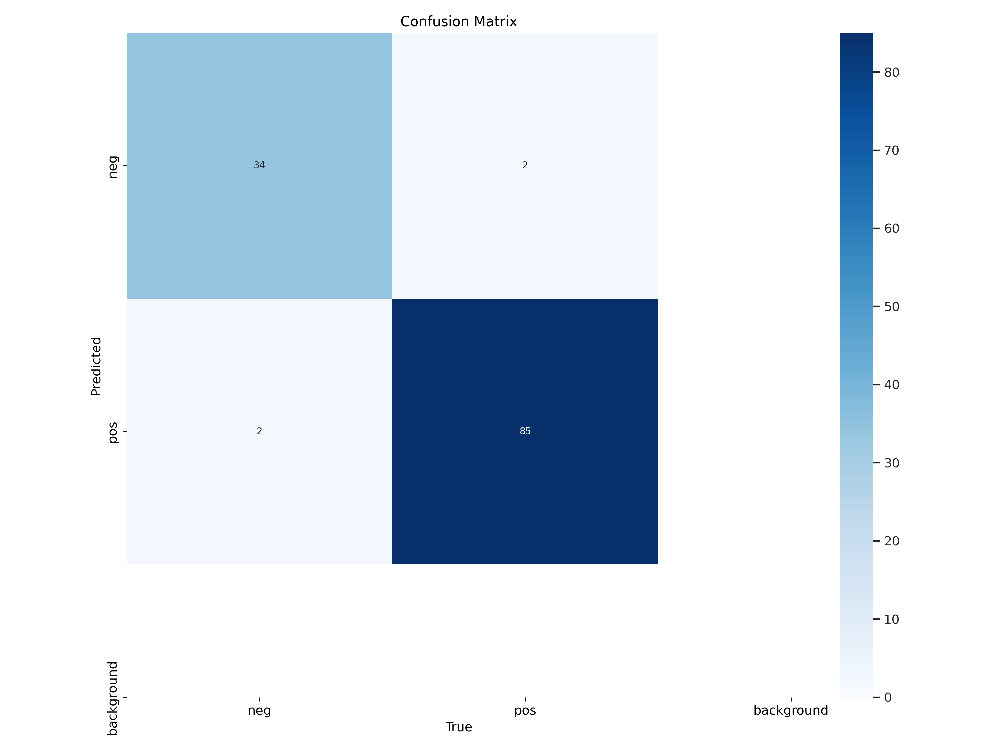

In [ ]:
cm_img_new = Image.open(r"./runs/classify/train/confusion_matrix.png")
display(cm_img_new)

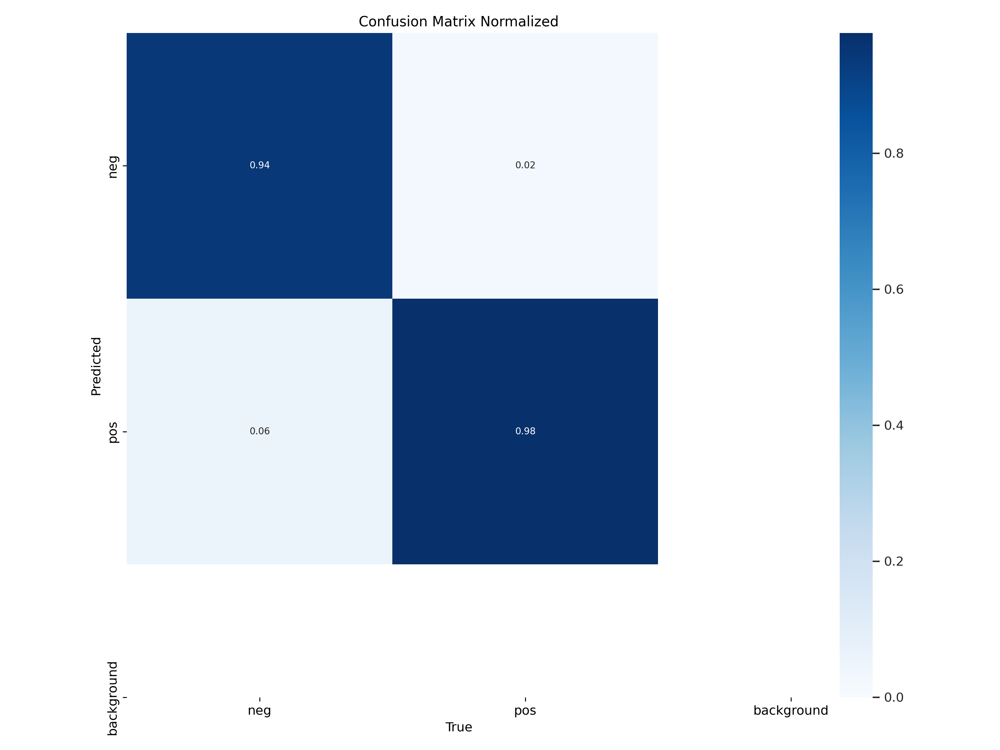

In [ ]:
cm_norm_img_new = Image.open(r"./runs/classify/train/confusion_matrix_normalized.png")
display(cm_norm_img_new)

# tracking video
* https://roboflow.com/video-inference/yolov8

In [ ]:
#pip install supervision -q -U

In [ ]:
pip install pytube -q -U

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.1 MB/s eta 0:00:00


In [ ]:
pip install pytubefix -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.0/77.0 kB 3.4 MB/s eta 0:00:00


In [ ]:
from pytube import YouTube
from pytube.innertube import _default_clients

_default_clients["ANDROID_MUSIC"] = _default_clients["ANDROID_CREATOR"]

In [ ]:
#YouTube('https://www.youtube.com/watch?v=XbJ8J95iXb0').streams.first().download()

In [ ]:
pip install logger -q

  Preparing metadata (setup.py) ... done


In [ ]:
import logging

In [ ]:
from pytube import cipher
import re

def get_throttling_function_name(js: str) -> str:
    """Extract the name of the function that computes the throttling parameter.

    :param str js:
        The contents of the base.js asset file.
    :rtype: str
    :returns:
        The name of the function used to compute the throttling parameter.
    """
    function_patterns = [
        # https://github.com/ytdl-org/youtube-dl/issues/29326#issuecomment-865985377
        # https://github.com/yt-dlp/yt-dlp/commit/48416bc4a8f1d5ff07d5977659cb8ece7640dcd8
        # var Bpa = [iha];
        # ...
        # a.C && (b = a.get("n")) && (b = Bpa[0](b), a.set("n", b),
        # Bpa.length || iha("")) }};
        # In the above case, `iha` is the relevant function name
        r'a\.[a-zA-Z]\s*&&\s*\([a-z]\s*=\s*a\.get\("n"\)\)\s*&&\s*'
        r'\([a-z]\s*=\s*([a-zA-Z0-9$]+)(\[\d+\])?\([a-z]\)',
        r'\([a-z]\s*=\s*([a-zA-Z0-9$]+)(\[\d+\])\([a-z]\)',
    ]
    logging.debug('Finding throttling function name')
    for pattern in function_patterns:
        regex = re.compile(pattern)
        function_match = regex.search(js)
        if function_match:
            logging.debug("finished regex search, matched: %s", pattern)
            if len(function_match.groups()) == 1:
                return function_match.group(1)
            idx = function_match.group(2)
            if idx:
                idx = idx.strip("[]")
                array = re.search(
                    r'var {nfunc}\s*=\s*(\[.+?\]);'.format(
                        nfunc=re.escape(function_match.group(1))),
                    js
                )
                if array:
                    array = array.group(1).strip("[]").split(",")
                    array = [x.strip() for x in array]
                    return array[int(idx)]

    raise RegexMatchError(
        caller="get_throttling_function_name", pattern="multiple"
    )

cipher.get_throttling_function_name = get_throttling_function_name

In [ ]:
YouTube('https://www.youtube.com/watch?v=XbJ8J95iXb0').streams.first().download()

'/content/Old People Being Clumsy For 8 Minutes Straight 😂.mp4'

In [ ]:
VIDEO_PATH = r"/content/Old People Being Clumsy For 8 Minutes Straight 😂.mp4"

In [ ]:
# from IPython.display import HTML
# from base64 import b64encode
# mp4 = open(VIDEO_PATH,'rb').read()
# data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
# HTML("""
# <video width=400 controls>
#       <source src="%s" type="video/mp4">
# </video>
# """ % data_url)

In [ ]:
# from IPython.display import Video

# Video(VIDEO_PATH)

# Create a Video Processing Callback

In [ ]:
pip install supervision -U -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 5.0 MB/s eta 0:00:00


In [ ]:
import supervision as sv

In [ ]:
def process_frame(frame: np.ndarray, _) -> np.ndarray:
    results = model(frame, imgsz=1280)[0]

    #detections = sv.Detections.from_yolov8(results)
    #box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)

    #labels = [f"{model.names[class_id]} {confidence:0.2f}" for _, _, confidence, class_id, _ in detections]
    frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)

    return frame

In [ ]:
#sv.process_video(source_path=VIDEO_PATH, target_path=f"result.mp4", callback=process_frame)

# extract frames from video

In [ ]:
import cv2
import os

def extract_frames(video_path, output_dir, num_frames=16):
    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video
    num_frames_total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the step size for the sliding window based on the desired number of frames
    step_size = max(num_frames_total // num_frames, 1)

    # Initialize the current frame number and the frame counter
    frame_num = 0
    count = 0

    # Loop through the video frames and extract a frame every step_size frames
    while True:
        # Read the current frame
        ret, frame = cap.read()

        # If we've reached the end of the video, break out of the loop
        if not ret:
            break

        # If the current frame number is a multiple of the step size, save the frame
        if frame_num % step_size == 0:
            # Construct the output filename
            output_path = os.path.join(output_dir, f'frame_{count:04d}.jpg')

            # Save the frame to disk
            cv2.imwrite(output_path, frame)

            # Increment the frame counter
            count += 1

        # Increment the current frame number
        frame_num += 1

    # Release the video file
    cap.release()

    # Return the total number of frames extracted
    return count


In [ ]:
# Define the input and output directories
video_file = VIDEO_PATH
output_dir = './drive/MyDrive/Summer_CV/video/'

In [ ]:
# Number of frames to extract from each video
num_frames = 20 #you name it

extract_frames(video_file, output_dir, num_frames)

# Loop through all video files in the input directory
# for filename in os.listdir(input_dir):
# if video_file.endswith('.mp4') or video_file.endswith('.avi'):
#     # Path to input and output files
#     #input_file = os.path.join(input_dir, filename)
#     output_file = os.path.join(output_dir, os.path.splitext(filename)[0])

#     # Create the output directory if it doesn't exist
#     if not os.path.exists(output_file):
#         os.makedirs(output_file)

    # Extract frames from the video file
    # extract_frames(input_file, output_file, num_frames)

    # print(f'{num_frames} frames extracted from {input_file} and saved to {output_file}')

# Extract and resize frames

In [ ]:
# from PIL import Image
# import os
# import uuid

# # Set the paths for the input and output directories
# input_dir = "./video_frames/youtube_spl_video"
# output_dir = "./frames_resize"

# assert os.path.exists(output_dir)

# print(f"{len(os.listdir(input_dir))} images to be resized")
# # Loop through all the subdirectories of the input directory
# for filename in os.listdir(input_dir):
#     if filename.endswith(".jpg") or filename.endswith(".png"):
#         # Open the image and resize it to 64x64
#         image_path = os.path.join(input_dir, filename)
#         image = Image.open(image_path)
#         resized_image = image.resize((256, 256))

#         # Generate a unique filename and save the resized image to the output directory
#         unique_filename = str(uuid.uuid4()) + ".jpg"
#         output_path = os.path.join(output_dir, unique_filename)
#         resized_image.save(output_path)


In [ ]:
#print(f"{len(os.listdir(output_dir))} images have been resized")

In [ ]:
!yolo task=classify mode=predict model=./runs/classify/train/weights/best.pt conf=0.25 source=./drive/MyDrive/Summer_CV/video/

Ultralytics YOLOv8.2.85 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x-cls summary (fused): 133 layers, 56,125,762 parameters, 0 gradients, 153.8 GFLOPs

image 1/49 /content/drive/MyDrive/Summer_CV/video/frame_0000.jpg: 128x128 neg 0.54, pos 0.46, 11.9ms
image 2/49 /content/drive/MyDrive/Summer_CV/video/frame_0001.jpg: 128x128 neg 0.84, pos 0.16, 15.4ms
image 3/49 /content/drive/MyDrive/Summer_CV/video/frame_0002.jpg: 128x128 neg 0.64, pos 0.36, 12.7ms
image 4/49 /content/drive/MyDrive/Summer_CV/video/frame_0003.jpg: 128x128 pos 0.62, neg 0.38, 13.4ms
image 5/49 /content/drive/MyDrive/Summer_CV/video/frame_0004.jpg: 128x128 pos 0.67, neg 0.33, 11.8ms
image 6/49 /content/drive/MyDrive/Summer_CV/video/frame_0005.jpg: 128x128 neg 0.73, pos 0.27, 12.3ms
image 7/49 /content/drive/MyDrive/Summer_CV/video/frame_0006.jpg: 128x128 pos 0.67, neg 0.33, 12.0ms
image 8/49 /content/drive/MyDrive/Summer_CV/video/frame_0007.jpg: 128x128 pos 0.87, neg 0.13, 11.8ms
image 9/49 /co

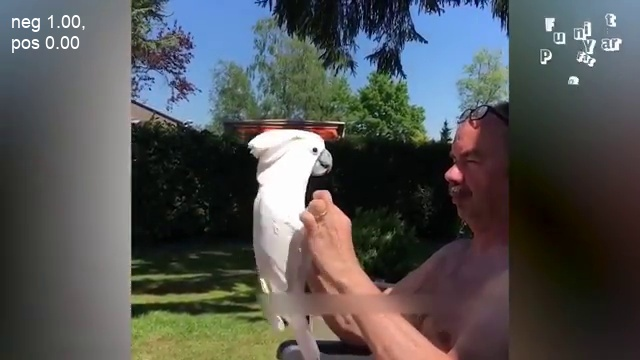

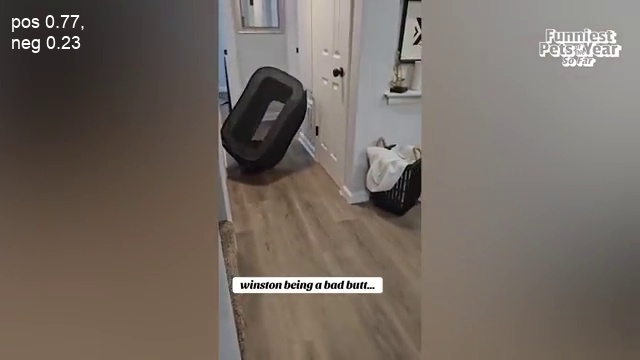

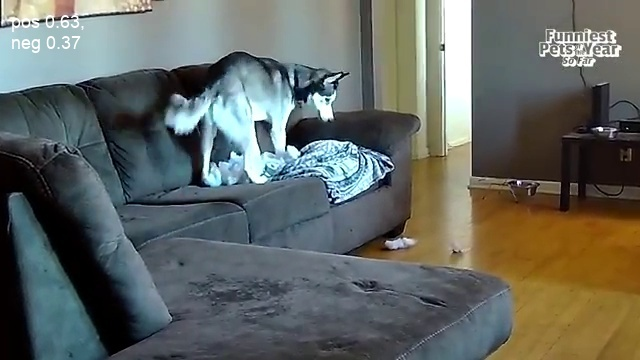

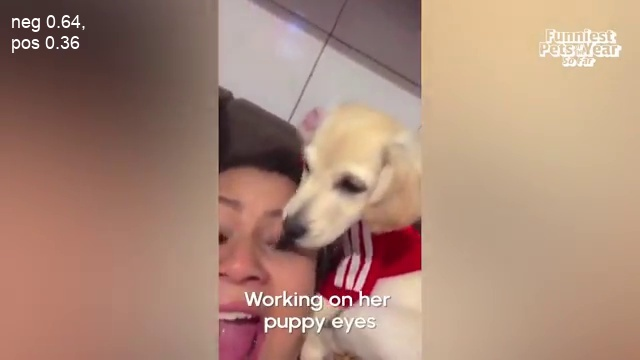

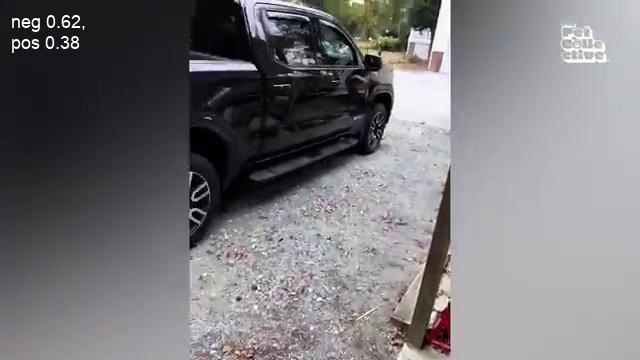

...

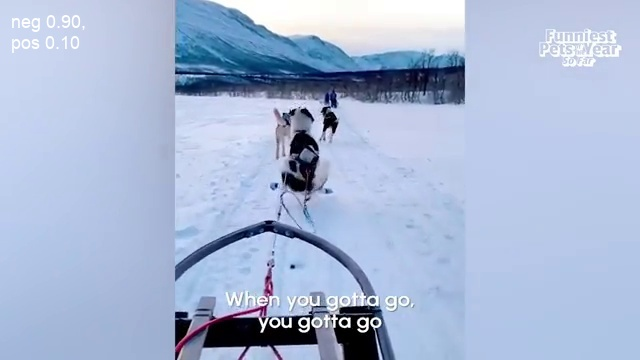

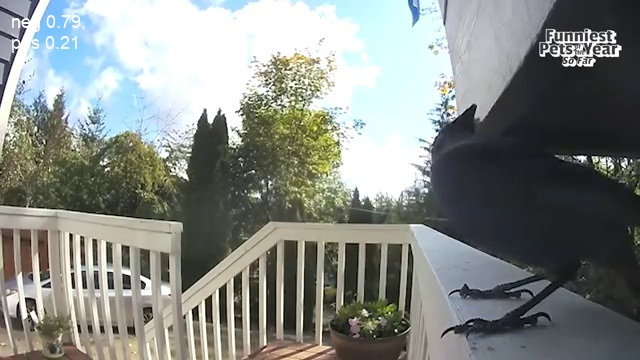

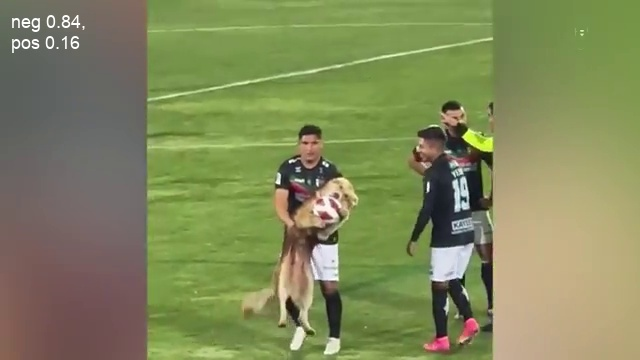

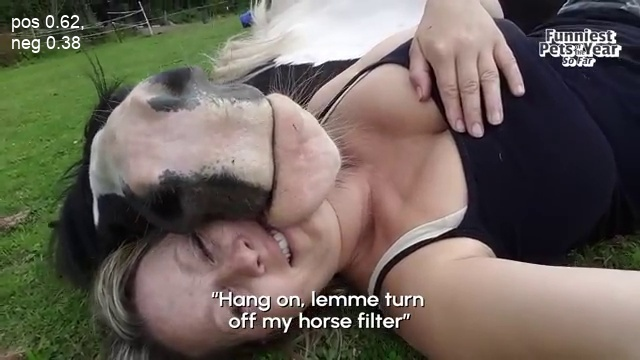

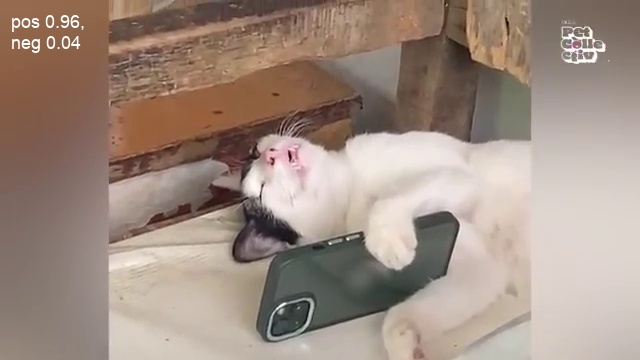

In [ ]:
for i in os.listdir("./runs/classify/predict"):
    img = Image.open(f"./runs/classify/predict/{i}")
    display(img)

# video classification - based falldown probabilities on frames

In [ ]:
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from timeit import default_timer as timer
import os

# returning classifiers output
def video_classifier(inp):
    model = YOLO("./runs/classify/train18/weights/best.pt")

    result = model.predict(source=inp)
    probs = result[0].probs
    max_tensor = max(probs) #get max prob for falldown
    tensor_pos = ((probs == max_tensor).nonzero(as_tuple=True)[0])

    return format.get(int(tensor_pos))

# deploy the model on gradio

In [ ]:
# gradio code block for input and output
with gr.Blocks() as app:
    gr.Markdown("## Video classification using Yolov8")
    with gr.Row():
        inp_video = gr.Video()
        out_txt = gr.Textbox()
    btn = gr.Button(value="Submit")
    btn.click(video_classifier, inputs=inp_video, outputs=out_txt)

app.launch()